## Empirically testing the birthday problem

The purpose of this notebook is to attempt to understand how the birthday problem changes if we use real birthday data. Investigating this also allows me to learn the basic functions of `pandas`.

We first remark that this has been discussed in [The Uniformity Assumption in the Birthday Problem](http://www.jstor.org/stable/2689391), Geoffrey C. Berresford, Mathematics Magazine, Vol. 53, No. 5 (Nov., 1980). The key takeaways are:
 - The assumption that every birthday is equally likely greatly simplifies the computation
 - Any other distribution will find a pair of people with the same birthday with less people in the room. That is, they prove that the number of the people needed to have a 50% chance of someone sharing a birthday is at most 23.
 - They also managed to investigate numerically the case where the uniformity assumption is slightly relaxed (specifically, they allow for a fixed number of different probabilities).

The variant we consider will include leap days; instead of computing the probability analytically or numerically, we estimate the number of people by repeated sampling. 

We use the $1995$-$2014$ data from the [ONS](https://www.ons.gov.uk/peoplepopulationandcommunity/birthsdeathsandmarriages/livebirths/articles/howpopularisyourbirthday/2015-12-18).

We note from [the article](https://www.ons.gov.uk/peoplepopulationandcommunity/birthsdeathsandmarriages/livebirths/articles/howpopularisyourbirthday/2015-12-18) that the leap year data has been normalised so that years without leap years are ignored. We adjust this as follows. There are $5$ leap years considered in the data set of $20$ years: $1996,2000,2004,2008,2012$. So we should replace the current average by 
$\text{avg}_{\text{new}} = \text{avg}_{\text{old}}/4 $.

In [17]:
import pandas as pd
pd.options.plotting.backend = "plotly" # requires plotly installed. See https://plotly.com/python/pandas-backend/

import numpy as np
import typing

In [25]:
bdays = pd.read_csv('birthdays.csv')

avg_old = bdays[bdays.date=="29-Feb"].average
bdays.average = bdays.average.replace([avg_old], avg_old/4)

bdays[bdays.date=="29-Feb"]

,date,average
59,29-Feb,447.05


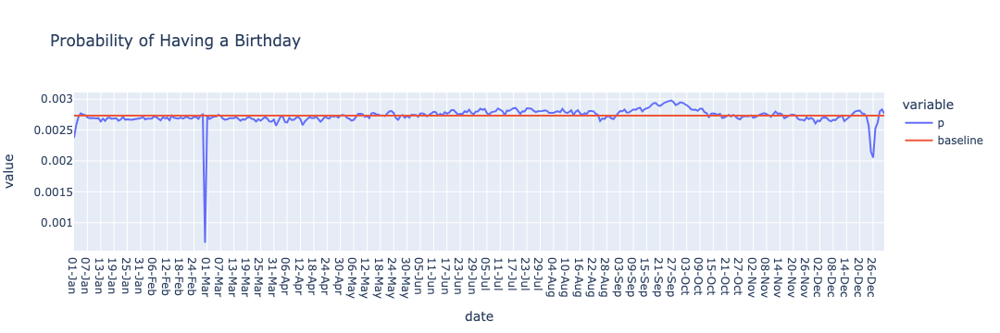

In [18]:
pr = bdays[['date']]
pr['p'] = bdays.average / bdays.average.sum()
pr['baseline'] = 1.0/366

fig = pr.plot('date',['p','baseline'], title='Probability of Having a Birthday')
fig

Aside from the now reduced probability of being born on the 29th of February, other notable features include a bump in births around September corresponding to New Years' celebrations, and a drop around Christmas which puzzles me (despite knowing multiple people born on the local minimum 26th of December.) 

For each specific birthday, the number of people you have to wait until you see someone with that birthday is geometric, with probability of 'success' the proportion of people born on that day against the total sample. So the probability of having seen at least one person with your birthday is the CDF $1 - (1-p)^{k-1}$. This probability is not at all unintuitive.

In [5]:
pr['personal10']   = 1 - (1-pr.p) ** (10-1) 
pr['personal50']   = 1 - (1-pr.p) ** (50-1)
pr['personal100']  = 1 - (1-pr.p) ** (100-1) 
pr['personal200']  = 1 - (1-pr.p) ** (200-1) 
pr['personal365']  = 1 - (1-pr.p) ** (365-1) 
pr['personal1000'] = 1 - (1-pr.p) ** (1000-1) 

personal_cols = [col for col in pr.columns if col.startswith('personal')]

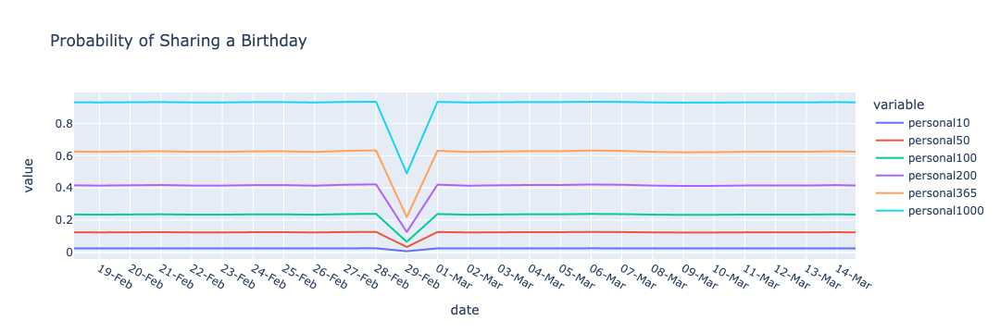

In [6]:
fig = pr.plot(x='date', y=personal_cols, title='Probability of Sharing a Birthday')
fig.show()

Now we estimate the number of people needed by simulating rooms of people and incrementing a counter when they have at least one pair of birthdays. As mentioned earlier, under the uniform distribution, we will require 23 people, and our distribution will require at most this many people.

In [7]:
def probPair(k: int, sampleSize: int=10000):
    count = 0 
    for _ in range(sampleSize):
        sample = bdays.sample(n=k,weights='average', replace=True)
        counts = sample['date'].value_counts()
        if len(counts[counts>1]) > 0: count = count+1
    return count/sampleSize

def baseProbPair(k: int):
    j = np.arange(k)
    return 1 - np.prod(1-j/365)

In [8]:
bdayProblem = pd.DataFrame([(k, probPair(k),baseProbPair(k)) for k in range(50)], columns=['k','p','base'])

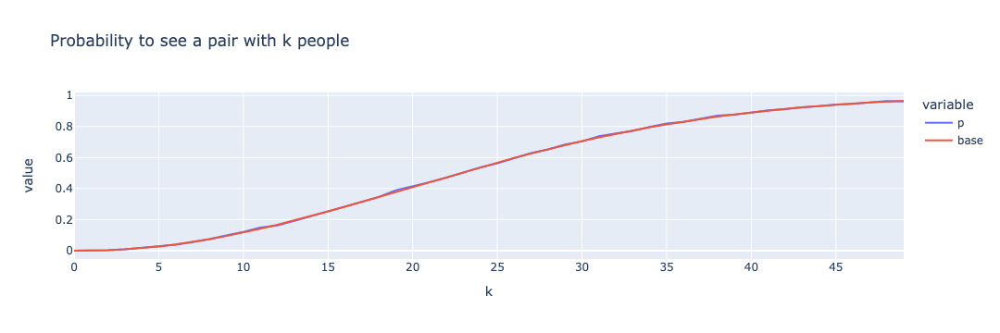

In [9]:
bdayProblem.plot('k',['p','base'], title="Probability to see a pair with k people")

The graphs turn out to be very close. To investigate to higher accuracy would require more computing power than I have available.

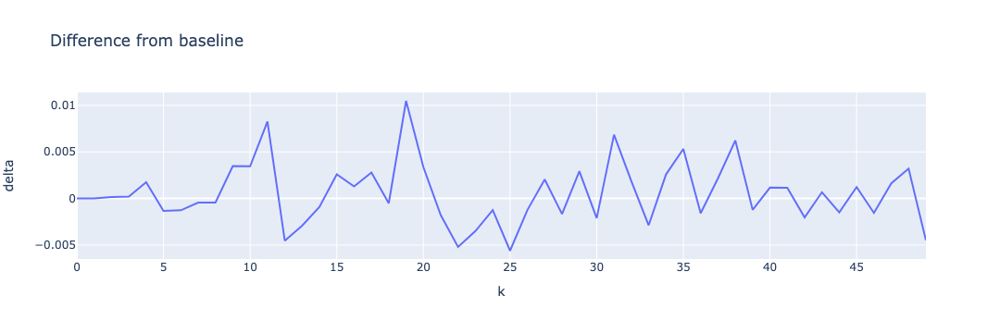

In [10]:
bdayProblem['delta'] = bdayProblem.p - bdayProblem.base
bdayProblem.plot('k','delta', title="Difference from baseline")

Going back to the uniformity assumption lets us investigate different sized collections. Here are the numbers N required for 50% probability in a collection of size days (e.g. at $\text{days}=365$, $\text{requiredN} = 23$)

In [11]:
def requiredNfor50(days: int):
    ans = 0
    prob = 1
    for d in range(days):
        prob = prob * (1 - d/days)
        ans += 1
        if prob < 0.5:
            break
    return ans

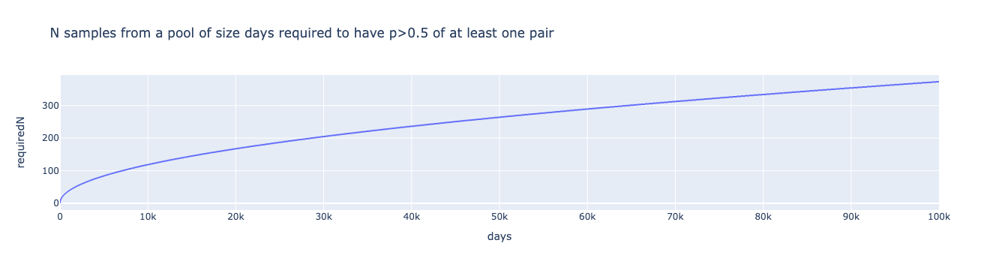

In [26]:
requiredNs = pd.DataFrame([(d, requiredNfor50(d)) for d in range(100000)], columns=['days','requiredN'])
requiredNs.plot('days','requiredN', title='N samples from a pool of size days required to have p>0.5 of at least one pair')

This looks like a squareroot graph, which is essentially correct as this linear regression on the loglogplot shows:

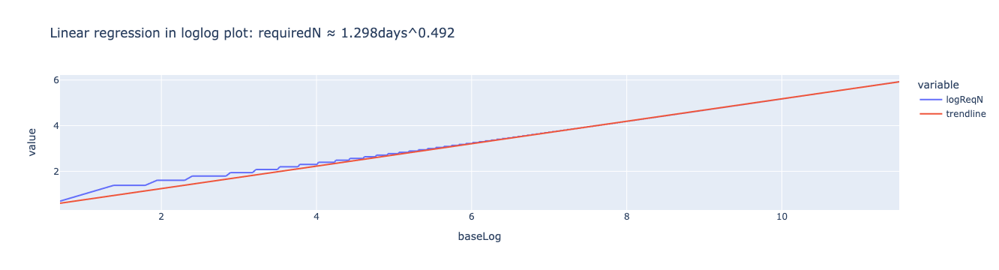

In [27]:
requiredNs['logReqN'] = np.log(1+requiredNs.requiredN)
requiredNs['baseLog'] = np.log(1+requiredNs.days)

requiredNs.drop(index=requiredNs.index[0], inplace=True)
requiredNs.plot('baseLog','logReqN')

z = np.polyfit(x=requiredNs['baseLog'], y=requiredNs['logReqN'], deg=1)
p = np.poly1d(z)
requiredNs['trendline'] = p(requiredNs['baseLog'])
requiredNs.plot('baseLog',['logReqN','trendline'], 
                title= r'Linear regression in loglog plot: ' + r'requiredN ≈ {0:.3f}'.format(np.exp(z[1])) + r'days^' + '{0:.3f}'.format(z[0]) )

(The best line is not a good match near the origin because there is comparatively very little data there.)